In [2]:
import numpy as np
import pandas as pd

reviews_df = pd.read_csv('./datasets/reviews_translated.csv')
reviews_df

,Unnamed: 0,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,I received it well before the stipulated time.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Congratulations Lannister stores I loved shopp...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...,...
99219,99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excellent backpack, super fast delivery. I hig...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


In [3]:
orders_df = pd.read_csv('./datasets/olist_orders_dataset.csv')

# keep only customer_id and order_id
orders_df = orders_df[['customer_id', 'order_id']]

orders_df

,customer_id,order_id
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451
2,41ce2a54c0b03bf3443c3d931a367089,47770eb9100c2d0c44946d9cf07ec65d
3,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a
4,8ab97904e6daea8866dbdbc4fb7aad2c,ad21c59c0840e6cb83a9ceb5573f8159
...,...,...
99436,39bd1228ee8140590ac3aca26f2dfe00,9c5dedf39a927c1b2549525ed64a053c
99437,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8
99438,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab
99439,b331b74b18dc79bcdf6532d51e1637c1,11c177c8e97725db2631073c19f07b62


In [4]:
# number of reviews that are NaN
reviews_df.isna().sum()

Unnamed: 0                     0
review_id                      0
order_id                       0
review_score                   0
review_comment_title       87660
review_comment_message     58275
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [5]:
# number of reviews that have a title but no review
reviews_df[reviews_df['review_comment_message'].isna() & reviews_df['review_comment_title'].notna()].shape

print("There are {} reviews that have a title but no review".format(reviews_df[reviews_df['review_comment_message'].isna() & reviews_df['review_comment_title'].notna()].shape[0]))

There are 1737 reviews that have a title but no review


In [6]:
# reviews that either have a title or a review
reviews_with_title_or_review = reviews_df[reviews_df['review_comment_message'].notna() | reviews_df['review_comment_title'].notna()]
reviews_with_title_or_review

,Unnamed: 0,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
3,3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,I received it well before the stipulated time.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Congratulations Lannister stores I loved shopp...,2018-03-01 00:00:00,2018-03-02 10:26:53
9,9,8670d52e15e00043ae7de4c01cc2fe06,b9bf720beb4ab3728760088589c62129,4,I recommend,efficient device. on the website the brand of ...,2018-05-22 00:00:00,2018-05-23 16:45:47
12,12,4b49719c8a200003f700d3d986ea1a19,9d6f15f95d01e79bd1349cc208361f09,4,NaN,But a little slowing down...for the price it's...,2018-02-16 00:00:00,2018-02-20 10:52:22
15,15,3948b09f7c818e2d86c9a546758b2335,e51478e7e277a83743b6f9991dbfa3fb,5,highly recommend,"Reliable seller, ok product and delivery on time.",2018-05-23 00:00:00,2018-05-24 03:00:01
...,...,...,...,...,...,...,...,...
99205,99205,98fffa80dc9acbde7388bef1600f3b15,d398e9c82363c12527f71801bf0e6100,4,NaN,for this product I received according to the p...,2017-11-29 00:00:00,2017-11-30 15:52:51
99208,99208,df5fae90e85354241d5d64a8955b2b09,509b86c65fe4e2ad5b96408cfef9755e,5,NaN,Delivered within the time frame. The product a...,2018-02-07 00:00:00,2018-02-19 19:47:23
99215,99215,a709d176f59bc3af77f4149c96bae357,d5cb12269711bd1eaf7eed8fd32a7c95,3,NaN,"The product was not sent with an invoice, ther...",2018-05-19 00:00:00,2018-05-20 21:51:06
99221,99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excellent backpack, super fast delivery. I hig...",2018-03-22 00:00:00,2018-03-23 09:10:43


In [7]:
# percentage of reviews that have a title or a review out of all reviews
print("Percentage of reviews that have a title or a review out of all reviews: {:.2f}%".format(reviews_with_title_or_review.shape[0] / reviews_df.shape[0] * 100))

Percentage of reviews that have a title or a review out of all reviews: 43.02%


In [8]:
# inner join orders_df and reviews_with_title_or_review
orders_with_review = pd.merge(orders_df, reviews_with_title_or_review, on='order_id', how='inner', validate='one_to_many')
orders_with_review

,customer_id,order_id,Unnamed: 0,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,32790,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"I haven't tested the product yet, but it came ...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451,29158,8d5266042046a06655c8db133d120ba5,4,Very good the store,The product is very good.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a,77520,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,The product was exactly what I expected and wa...,2017-12-03 00:00:00,2017-12-05 19:21:58
3,ed0271e0b7da060a393796590e7b737a,136cce7faa42fdb2cefd53fdc79a6098,28656,e07549ef5311abcc92ba1784b093fb56,2,NaN,I was sad that he didn't answer me.,2017-05-13 00:00:00,2017-05-13 20:25:42
4,494dded5b201313c64ed7f100595b95c,e6ce16cb79ec1d90b1da9085a6118aeb,49954,15898b543726a832d4137fbef5d1d00e,1,NaN,Waiting for return from the store,2017-05-30 00:00:00,2017-05-30 23:13:47
...,...,...,...,...,...,...,...,...,...
42681,8e1ec396e317ff4c82a03ce16a0c3eb3,b0f4af5c1b06e24fef510703bfe9f0a6,10208,ede62474f1618961be12678f362dca4a,5,NaN,Great to buy on this site the goods arrive bef...,2017-11-11 00:00:00,2017-11-15 09:54:14
42682,a2f7428f0cafbc8e59f20e1444b67315,cfa78b997e329a5295b4ee6972c02979,15586,8ea780895f362ce949029f95b7181ff0,1,NaN,"It is not a mini cajon, it is a shaker, that i...",2018-01-19 00:00:00,2018-01-21 02:51:39
42683,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8,55670,29bb71b2760d0f876dfa178a76bc4734,4,NaN,Just a piece that came cracked but that's ok lol,2018-03-01 00:00:00,2018-03-02 17:50:01
42684,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab,43847,371579771219f6db2d830d50805977bb,5,NaN,It was delivered before the deadline.,2017-09-22 00:00:00,2017-09-22 23:10:57


In [9]:
orders_with_review['review_comment_message'] = orders_with_review['review_comment_message'].fillna(orders_with_review['review_comment_title'])

In [10]:
# group by customer_id and concatenate all reviews
orders_with_review = orders_with_review.groupby('customer_id')['review_comment_message'].apply(lambda x: ' '.join(x)).reset_index()
orders_with_review

,customer_id,review_comment_message
0,00012a2ce6f8dcda20d059ce98491703,Everything as expected
1,0001fd6190edaaf884bcaf3d49edf079,Very good
2,0004164d20a9e969af783496f3408652,Product lacks clear information.
3,00050bf6e01e69d5c0fd612f1bcfb69c,great product
4,00066ccbe787a588c52bd5ff404590e3,"Missing 3 chandeliers from my purchase, only o..."
...,...,...
42534,fff93c1da78dafaaa304ff032abc6205,highly recommend
42535,fffc22669ca576ae3f654ea64c8f36be,I do not recommend this store because just kno...
42536,fffcb937e9dd47a13f05ecb8290f4d3e,"the product was delivered before the deadline,..."
42537,ffff42319e9b2d713724ae527742af25,A good quality product and on time delivery


In [11]:
# check for unique customer_id
orders_with_review['customer_id'].nunique()

42539

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer
import pandas as pd
import re

# create a stemmer
stemmer = PorterStemmer()

# create a tf-idf vectorizer
# create a tf-idf vectorizer that removes words that appear in more than 50% of the documents and words that appear in less than 1% of the documents
tfidf = TfidfVectorizer(stop_words='english', max_df=0.5, min_df=0.01)

# apply preprocessing steps to the review_comment_message column
orders_with_review['review_comment_message'] = orders_with_review['review_comment_message'].str.lower()
orders_with_review['review_comment_message'] = orders_with_review['review_comment_message'].apply(lambda x: re.sub('[^\w\s]', '', x))
orders_with_review['review_comment_message'] = orders_with_review['review_comment_message'].apply(lambda x: ' '.join([stemmer.stem(word) for word in x.split()]))

# fit the vectorizer on the preprocessed review_comment_message column
tfidf.fit(orders_with_review['review_comment_message'])

# transform the preprocessed review_comment_message column
tfidf_vectors = tfidf.transform(orders_with_review['review_comment_message'])

# create a dataframe from the tfidf vectors
tfidf_df = pd.DataFrame(tfidf_vectors.toarray(), columns=tfidf.get_feature_names_out())

# add the customer_id column to the dataframe
tfidf_df['customer_id'] = orders_with_review['customer_id']

# set the customer_id column as the first column
tfidf_df = tfidf_df.set_index('customer_id').reset_index()

tfidf_df

,customer_id,advertis,ahead,alreadi,alway,ani,anoth,arriv,bad,beauti,...,took,use,veri,wa,wait,want,watch,websit,work,wrong
0,00012a2ce6f8dcda20d059ce98491703,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0001fd6190edaaf884bcaf3d49edf079,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.688274,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0004164d20a9e969af783496f3408652,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,00050bf6e01e69d5c0fd612f1bcfb69c,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,00066ccbe787a588c52bd5ff404590e3,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42534,fff93c1da78dafaaa304ff032abc6205,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42535,fffc22669ca576ae3f654ea64c8f36be,0.0,0.0,0.0,0.0,0.3038,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42536,fffcb937e9dd47a13f05ecb8290f4d3e,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.272536,0.281362,0.0,0.0,0.0,0.0,0.0,0.0
42537,ffff42319e9b2d713724ae527742af25,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
# from sklearn.feature_extraction.text import TfidfVectorizer

# # create a tf-idf vectorizer that removes words that appear in more than 50% of the documents and words that appear in less than 1% of the documents
# tfidf = TfidfVectorizer(max_df=0.5, min_df=0.01)

# # fit the vectorizer on the review_comment_message column
# tfidf.fit(orders_with_review['review_comment_message'])

# # transform the review_comment_message column
# tfidf_vectors = tfidf.transform(orders_with_review['review_comment_message'])

# # create a dataframe from the tfidf vectors
# tfidf_df = pd.DataFrame(tfidf_vectors.toarray(), columns=tfidf.get_feature_names_out())

# # add the customer_id column to the dataframe
# tfidf_df['customer_id'] = orders_with_review['customer_id']

# # set the customer_id column as the first column
# tfidf_df = tfidf_df.set_index('customer_id').reset_index()

# tfidf_df

In [14]:
# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [15]:
customer_df = pd.read_csv('./datasets/olist_customers_dataset.csv')


In [16]:
data = tfidf_df

In [17]:
data

,customer_id,advertis,ahead,alreadi,alway,ani,anoth,arriv,bad,beauti,...,took,use,veri,wa,wait,want,watch,websit,work,wrong
0,00012a2ce6f8dcda20d059ce98491703,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0001fd6190edaaf884bcaf3d49edf079,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.688274,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0004164d20a9e969af783496f3408652,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,00050bf6e01e69d5c0fd612f1bcfb69c,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,00066ccbe787a588c52bd5ff404590e3,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42534,fff93c1da78dafaaa304ff032abc6205,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42535,fffc22669ca576ae3f654ea64c8f36be,0.0,0.0,0.0,0.0,0.3038,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42536,fffcb937e9dd47a13f05ecb8290f4d3e,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.272536,0.281362,0.0,0.0,0.0,0.0,0.0,0.0
42537,ffff42319e9b2d713724ae527742af25,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
from sklearn.ensemble import IsolationForest

clf = IsolationForest(contamination=0.01)  # adjust contamination as needed
clf.fit(data.iloc[:, 1:])
outliers = clf.predict(data.iloc[:, 1:])

data["outliers"] = outliers
# customer_df["outliers"] = outliers

# Data without outliers
data_no_outliers = data[data["outliers"] == 1]
data_no_outliers = data_no_outliers.drop(["outliers"], axis = 1)

In [19]:
data_no_outliers

,customer_id,advertis,ahead,alreadi,alway,ani,anoth,arriv,bad,beauti,...,took,use,veri,wa,wait,want,watch,websit,work,wrong
0,00012a2ce6f8dcda20d059ce98491703,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0001fd6190edaaf884bcaf3d49edf079,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.688274,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0004164d20a9e969af783496f3408652,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,00050bf6e01e69d5c0fd612f1bcfb69c,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,00066ccbe787a588c52bd5ff404590e3,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42534,fff93c1da78dafaaa304ff032abc6205,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42535,fffc22669ca576ae3f654ea64c8f36be,0.0,0.0,0.0,0.0,0.3038,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42536,fffcb937e9dd47a13f05ecb8290f4d3e,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.272536,0.281362,0.0,0.0,0.0,0.0,0.0,0.0
42537,ffff42319e9b2d713724ae527742af25,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning


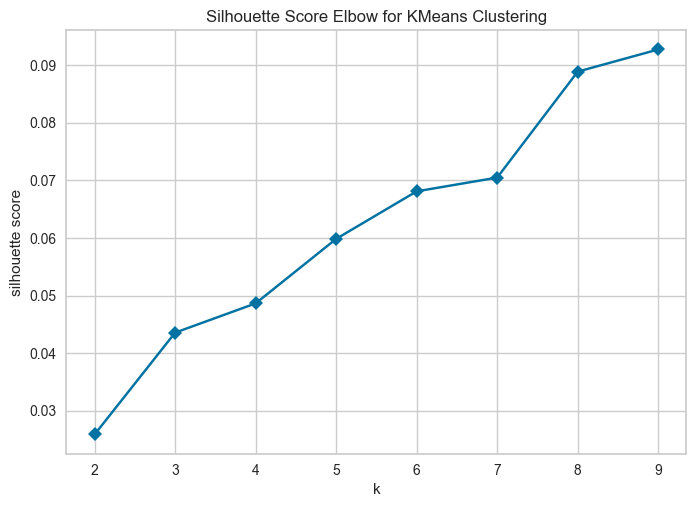

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [20]:
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True, metric="silhouette", timings=False)

visualizer.fit(data_no_outliers.iloc[:, 1:])        # Fit the data to the visualizer
visualizer.show()

In [21]:
n_clusters = 3

In [22]:
km = KMeans(n_clusters=n_clusters, init='k-means++', n_init=10, max_iter=100, random_state=42)
clusters_predict = km.fit_predict(data_no_outliers.iloc[:, 1:])
print(km.inertia_)

35345.4443591559


In [23]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(data_no_outliers.iloc[:, 1:],clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(data_no_outliers.iloc[:, 1:],clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(data_no_outliers.iloc[:, 1:],clusters_predict)}")

Davies bouldin score: 3.63265852753811
Calinski Score: 1535.4730108427245
Silhouette Score: 0.05159368893079461


In [24]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["component-1", "component-2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["component-1", "component-2", "component-3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()

    fig = px.scatter_3d(df, 
                        x=columns[0], 
                        y=columns[1], 
                        z=columns[2],
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'component-3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()


    fig = px.scatter(df, 
                        x=columns[0], 
                        y=columns[1],
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [25]:
data_no_outliers.describe()

,advertis,ahead,alreadi,alway,ani,anoth,arriv,bad,beauti,becaus,...,took,use,veri,wa,wait,want,watch,websit,work,wrong
count,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,...,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000,42113.000000
mean,0.008622,0.014727,0.009369,0.009919,0.005993,0.006541,0.051676,0.005382,0.019293,0.012283,...,0.006304,0.010960,0.069231,0.050464,0.011992,0.009119,0.006821,0.007484,0.010355,0.006131
std,0.074267,0.085253,0.064121,0.074437,0.054738,0.057618,0.135763,0.058867,0.105556,0.071263,...,0.059263,0.081757,0.175426,0.134605,0.077829,0.068363,0.063505,0.062019,0.077691,0.057657
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,0.840351,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [26]:
pca_3d_object, df_pca_3d = get_pca_3d(data_no_outliers.iloc[:, 1:], clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=0.8, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              2.518         2.27%                      2.27%
1              1.964         1.77%                      4.04%
2              1.871         1.69%                      5.72%


In [27]:
pca_2d_object, df_pca_2d = get_pca_2d(data_no_outliers.iloc[:, 1:], clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=0.8, width_line = 0.1)

In [147]:
df_tsne_3d = TSNE(
    n_components=3,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
).fit_transform(data_no_outliers.iloc[:, 1:])
df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["component-1", "component-2", "component-3"])
df_tsne_3d["cluster"] = clusters_predict
plot_pca_3d(df_tsne_3d, title = "TSNE Space", opacity=0.8, width_line = 0.1)

In [28]:
df_tsne_2d = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    random_state=42
).fit_transform(data_no_outliers.iloc[:, 1:])
df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["component-1", "component-2"])
df_tsne_2d["cluster"] = clusters_predict

plot_pca_2d(df_tsne_2d, title = "TSNE Space", opacity=0.8, width_line = 0.1)

In [142]:
data_no_outliers

,customer_id,advertis,ahead,alreadi,alway,ani,anoth,arriv,bad,beauti,...,took,use,veri,wa,wait,want,watch,websit,work,wrong
0,00012a2ce6f8dcda20d059ce98491703,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
1,0001fd6190edaaf884bcaf3d49edf079,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.688274,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
2,0004164d20a9e969af783496f3408652,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
3,00050bf6e01e69d5c0fd612f1bcfb69c,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
4,00066ccbe787a588c52bd5ff404590e3,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42534,fff93c1da78dafaaa304ff032abc6205,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42535,fffc22669ca576ae3f654ea64c8f36be,0.0,0.0,0.0,0.0,0.3038,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
42536,fffcb937e9dd47a13f05ecb8290f4d3e,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.272536,0.281362,0.0,0.0,0.0,0.0,0.0,0.0
42537,ffff42319e9b2d713724ae527742af25,0.0,0.0,0.0,0.0,0.0000,0.0,0.00000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [143]:
customer_df

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [144]:
# merge customer_df and data_no_outliers
customer_df = pd.merge(customer_df, data_no_outliers, on='customer_id', how='inner', validate='one_to_many')
customer_df

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,advertis,ahead,alreadi,alway,ani,...,took,use,veri,wa,wait,want,watch,websit,work,wrong
0,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5adf08e34b2e993982a47070956c5c65,1175e95fb47ddff9de6b2b06188f7e0d,81560,curitiba,PR,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4b7139f34592b3a31687243a302fa75b,9afe194fb833f79e300e37e580171f22,30575,belo horizonte,MG,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9fb35e4ed6f0a14a4977cd9aea4042bb,2a7745e1ed516b289ed9b29c7d0539a5,39400,montes claros,MG,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42108,935993f47af1ed7d0715c26b686341c5,4452b8ef472646c4cc042cb31a291f3b,12236,sao jose dos campos,SP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
42109,be842c57a8c5a62e9585dd72f22b6338,ca186065de6e2d01cfc99763e6d62048,99150,marau,RS,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
42110,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
42111,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [145]:
# characterizing the clusters
customer_df["cluster"] = clusters_predict

df_group = customer_df.groupby('cluster').agg(
    {
        'customer_id': 'count',
        'customer_unique_id': 'nunique',
        'customer_city': 'nunique',
        'customer_state': 'nunique',
    }
).reset_index()

df_group.columns = ['cluster', 'count', 'unique_customers', 'unique_cities', 'unique_states']

df_group


,cluster,count,unique_customers,unique_cities,unique_states
0,0,4066,4061,1014,27
1,1,4842,4825,1132,27
2,2,33205,32493,2977,27
